<a href="https://colab.research.google.com/github/Br-Julia/MVP-Analise-de-Dados-e-Boas-Praticas/blob/main/MVP_SPRINT_2_JB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#PUC - RIO
#MVP - Mínimo Produto Viável
#Sprint Análise de Dados e Boas Práticas
Profs. Tatiana Escovedo e Hugo Villamizar

Aluna: Julia Bragança dos Santos Ferreira Lima

#1. Apresentação e Objetivo do notebook

##1.1 Objetivo do Notebook


O objetivo deste notebook foi realizar análises em um Dataset chamado "Global Data on Sustainable Energy (2000-2020)", este dataset foi retirado do portal KAGGLE, da seguinte fonte: https://www.kaggle.com/datasets/anshtanwar/global-data-on-sustainable-energy.

A finalidade deste dataset não foi para utilização de machine learning, entretanto, é um dataset com variaveis númericas, que podem ser utilizados para análises preditivas, utilizando estudos de aprendizado supervisionado, como problemas de regressão.

As análises desse notebook, consistirão em verificar a evolução do acesso a eletricidade, energia de combustíveis fósseis, renovaveis e emissões de CO2 ao longo dos anos.

Serão realizados estudos da distribuição de emissão de carbono e geração de energias por continente, onde será necessário incluir um dataset auxiliar com os continentes por pais, tendo em vista que o dataset original não possui essa informação.

Serão verificados os países com maior número de emissão de CO2, com maior consumo de energia por pessoa, com maior geração de energia renovavél e por intermédio de combustíveis fósseis.

Ao fim, espera-se que seja possível visualizar qual tipo de decisões podem ser tomadas para aumentar a geração de energia renovavel e redução de emissão de CO2.


##1.2 Apresentação do Notebook


Os atributos do Dataset são os seguintes:
* País: Nome do País
* Ano: Ano que os dados foram retirados, entre 2000 e 2020.
* Acesso a eletricidade : A porcentagem da população com acesso a eletricidade (%).
* Acesso a combustível limpo para cozinha (% of population):Acesso a combustíveis limpos para cozinhar (% da população): A percentagem da população que depende principalmente de combustíveis limpos.
* Geração renovável por pessoa: Capacidade instalada de energia renovavel por pessoa
* Financiamento: Assistencia de paises desenvolvidos para projetos de energia sustentável (US).
* Renovável na matriz: Porcentagem de energia renovavel na matriz energética ( % ).
* Geração Fóssil: Eletricidade gerada por combustíveis fósseis(TWh).
* Geração Nuclear: Eletricidade gerada por energia nuclear (TWh).
* Energia Renovável: Eletricidade gerada por fontes de energia renováveis (TWh).
* Energia baixa emissão CO2: Porcentagem de eletricidade de fontes com baixa emissão de carbono (% electricity).
* Consumo/Pessoa: Consumo de energia por pessoa (kWh/person).
* Consumo/PIB/Poder Compra: Consumo de energia por unidade do PIB em paridade ao poder de compra (MJ/$2011 PPP GDP).
* Emissão CO2: Emissão de dióxido de carbono por pessoa (metric tons per capita).
* Primária Renovável: Energia primária equivalente derivada de fontes renováveis (% equivalent primary energy).
* PIB Crescimento: Taxa anual de crescimento do PIB com base na moeda local constante (annual %).
* PIB/Pessoa: Produto Interno Bruto por pessoa.
* Densidade Pop: Densidade populacional (P/Km2).
* Area: Área total do país (Km2).
* Latitude: Latitude do centróide do país em graus decimais.
* Longitude: Longitude do centróide do país em graus decimais.

In [ ]:
#Importação das bibliotecas
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import seaborn.objects as so
import numpy as np
from matplotlib import cm
import missingno as ms
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder

In [ ]:
#Instalação do Pandas Profiling
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


# 2. Carga dos Dados


Importando o Dataset principal e visualizando as primeiras linhas.

In [ ]:
#Definindo o nome das colunas do dataset
labels_atributos = ["País", "Ano", "Acesso a eletricidade(%)", "Acesso a combustível limpo cozinha (%)", "Geração renovável por pessoa", "Financiamento(US$)", "Renovavel na Matriz (%)", "Geração Fóssil (TWh)", "Geração Nuclear (TWh)", "Energia renovavel (TWh)", "Geração baixa emissão CO2 (%)", "Consumo/pessoa", "Consumo/PIB/Poder Compra",
"Emissão CO2 (m/Tons)", "Primária Renovavel (%)", "PIB Crescimento (% ano)", "PIB/Pessoa", "Densidade Pop (P/km²)", "Area (km²)", "Latitude", "Longitude"]

#Importando o Dataset Principal
dataset = pd.read_csv("https://raw.githubusercontent.com/Br-Julia/MVP-Analise-de-Dados-e-Boas-Praticas/main/global-data-on-sustainable-energy%20(1).csv", names=labels_atributos, header=1)

#Visualizando as primeiras linhas do Dataset Principal
dataset.head()

,País,Ano,Acesso a eletricidade(%),Acesso a combustível limpo cozinha (%),Geração renovável por pessoa,Financiamento(US$),Renovavel na Matriz (%),Geração Fóssil (TWh),Geração Nuclear (TWh),Energia renovavel (TWh),...,Consumo/pessoa,Consumo/PIB/Poder Compra,Emissão CO2 (m/Tons),Primária Renovavel (%),PIB Crescimento (% ano),PIB/Pessoa,Densidade Pop (P/km²),Area (km²),Latitude,Longitude
0,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,...,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
1,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,...,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953
2,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,...,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953
3,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,...,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953
4,Afghanistan,2005,25.390894,12.2,7.51,9830000.0,33.88,0.34,0.0,0.59,...,252.06912,1.41,1549.999952,NaN,11.229715,242.031313,60,652230.0,33.93911,67.709953


Por essa visualização é possível perceber que existem alguns dados ausentes, que serão estudados mais profundamente mais a frente, onde serão realizados os tratamentos necessários.

In [ ]:
#Importação do dataset auxiliar
continents = pd.read_csv("https://raw.githubusercontent.com/Br-Julia/MVP-Analise-de-Dados-e-Boas-Praticas/main/continents2.csv")

#Visualizando as primeiras linhas do Dataset Auxiliar
continents.head()

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN


Acima foi importado o dataset auxiliar com os países relacionados aos continentes. Este Dataset foi importado para que seja possível incluir a coluna de continentes e sub continentes, region e sub-region para melhoria nas análises.

Posteriormente será realizada a junção dos dois datasets e exclusão das colunas desnecessárias do dataset auxiliar.


In [ ]:
#realizando a junção dos dois datasets
dataset_merge = pd.merge(dataset, continents, left_on = 'País', right_on = 'name', how='inner')

#Visualizando as primeiras linhas do novo dataset
dataset_merge.head()

,País,Ano,Acesso a eletricidade(%),Acesso a combustível limpo cozinha (%),Geração renovável por pessoa,Financiamento(US$),Renovavel na Matriz (%),Geração Fóssil (TWh),Geração Nuclear (TWh),Energia renovavel (TWh),...,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,...,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,...,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
2,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,...,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
3,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,...,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
4,Afghanistan,2005,25.390894,12.2,7.51,9830000.0,33.88,0.34,0.0,0.59,...,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN


In [ ]:
#excluindo as colunas desnecessárias do dataset
dataset_merge = dataset_merge.drop(["name", "alpha-2","alpha-3", "country-code", "iso_3166-2", "intermediate-region", "region-code", "sub-region-code", "intermediate-region-code"], axis=1)

#visualizando as primeiras linhas do dataset com as colunas excluídas
dataset_merge.head()

,País,Ano,Acesso a eletricidade(%),Acesso a combustível limpo cozinha (%),Geração renovável por pessoa,Financiamento(US$),Renovavel na Matriz (%),Geração Fóssil (TWh),Geração Nuclear (TWh),Energia renovavel (TWh),...,Emissão CO2 (m/Tons),Primária Renovavel (%),PIB Crescimento (% ano),PIB/Pessoa,Densidade Pop (P/km²),Area (km²),Latitude,Longitude,region,sub-region
0,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,...,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953,Asia,Southern Asia
1,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,...,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953,Asia,Southern Asia
2,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,...,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953,Asia,Southern Asia
3,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,...,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953,Asia,Southern Asia
4,Afghanistan,2005,25.390894,12.2,7.51,9830000.0,33.88,0.34,0.0,0.59,...,1549.999952,NaN,11.229715,242.031313,60,652230.0,33.93911,67.709953,Asia,Southern Asia


#3. Análises Iniciais

##3.1 Estatísticas descritivas

In [ ]:
#Visualizando as dimensões do dataset
dataset_merge.shape

(3564, 23)

Com isso, verifica-se que este é um dataset com 3564 linhas e 23 colunas.

In [ ]:
#Visualizando as principais informações do dataset
dataset_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3564 entries, 0 to 3563
Data columns (total 23 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   País                                    3564 non-null   object 
 1   Ano                                     3564 non-null   int64  
 2   Acesso a eletricidade(%)                3556 non-null   float64
 3   Acesso a combustível limpo cozinha (%)  3395 non-null   float64
 4   Geração renovável por pessoa            2696 non-null   float64
 5   Financiamento(US$)                      1546 non-null   float64
 6   Renovavel na Matriz (%)                 3374 non-null   float64
 7   Geração Fóssil (TWh)                    3543 non-null   float64
 8   Geração Nuclear (TWh)                   3438 non-null   float64
 9   Energia renovavel (TWh)                 3543 non-null   float64
 10  Geração baixa emissão CO2 (%)           3522 non-null   floa

Com isso, é possível verificar as principais informações do dataset, e é possível visualizar que existem alguns valores nulos em alguns atributos.

In [ ]:
#Visualizando o resumo estatístico do dataset
dataset_merge.describe()

,Ano,Acesso a eletricidade(%),Acesso a combustível limpo cozinha (%),Geração renovável por pessoa,Financiamento(US$),Renovavel na Matriz (%),Geração Fóssil (TWh),Geração Nuclear (TWh),Energia renovavel (TWh),Geração baixa emissão CO2 (%),Consumo/pessoa,Consumo/PIB/Poder Compra,Emissão CO2 (m/Tons),Primária Renovavel (%),PIB Crescimento (% ano),PIB/Pessoa,Area (km²),Latitude,Longitude
count,3564.000000,3556.000000,3395.000000,2696.000000,1.546000e+03,3374.000000,3543.000000,3438.000000,3543.000000,3522.000000,3564.000000,3361.000000,3.140000e+03,1470.000000,3269.000000,3304.000000,3.563000e+03,3563.000000,3563.000000
mean,2010.042088,78.927714,63.502990,114.056439,9.506603e+07,32.586523,71.672916,13.623578,24.465854,37.068641,25881.669898,5.275957,1.631016e+05,12.095313,3.452547,13479.634920,6.470055e+05,17.804890,14.923218
std,6.052713,30.099434,39.079644,244.948825,2.993702e+08,29.861300,352.085524,73.873383,105.625556,34.572769,35073.989082,3.548142,7.832805e+05,15.166515,5.726043,19843.232113,1.601744e+06,24.168346,67.087166
min,2000.000000,1.252269,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.110000,1.000000e+01,0.000000,-62.075920,111.927225,2.100000e+01,-40.900557,-175.198242
25%,2005.000000,59.766514,23.200000,4.092500,2.800000e+05,6.250000,0.290000,0.000000,0.040000,2.867495,3123.591325,3.140000,2.027500e+03,2.106928,1.389896,1350.409308,2.320000e+04,1.836898,-11.779889
50%,2010.000000,98.100000,83.800000,33.830000,5.915000e+06,23.955000,2.880000,0.000000,1.420000,27.816965,12799.498000,4.250000,1.050500e+04,6.286573,3.580006,4603.992970,1.303700e+05,17.060816,19.503304
75%,2015.000000,100.000000,100.000000,112.982500,5.614750e+07,55.247500,26.845000,0.000000,10.070000,65.178155,33897.402500,5.940000,6.058500e+04,17.046923,5.866976,16098.196885,5.279680e+05,38.861034,46.869107
max,2020.000000,100.000000,100.000000,3060.190000,5.202310e+09,96.040000,5184.130000,809.410000,2184.940000,100.000010,262585.700000,32.570000,1.070722e+07,86.836586,123.139555,123514.196700,9.984670e+06,64.963051,178.065032


Com esse comando, podemos visualizar as estatísticas descritivas do dataset, como a média, desvio padrão, valor mínimo e máximo, e os quartis. Foi possível verificar que os valores estão dentro dos valores esperados, entretanto é possível visualizar que em algumas colunas os valores mínimos e máximos tem um range muito grande, os quais serão melhor observados posteriormente para verificação de possíveis outliers.

In [ ]:
#Visualização da correlação pelo método de Pearson
dataset_merge.corr(method = "pearson", numeric_only=True)

,Ano,Acesso a eletricidade(%),Acesso a combustível limpo cozinha (%),Geração renovável por pessoa,Financiamento(US$),Renovavel na Matriz (%),Geração Fóssil (TWh),Geração Nuclear (TWh),Energia renovavel (TWh),Geração baixa emissão CO2 (%),Consumo/pessoa,Consumo/PIB/Poder Compra,Emissão CO2 (m/Tons),Primária Renovavel (%),PIB Crescimento (% ano),PIB/Pessoa,Area (km²),Latitude,Longitude
Ano,1.000000,0.127708,0.073692,0.104637,0.142475,-0.031156,0.032951,-0.005279,0.074549,0.029874,0.003824,-0.161097,0.025034,0.103124,-0.192443,0.136049,-0.001710,0.004027,0.001311
Acesso a eletricidade(%),0.127708,1.000000,0.869193,0.267800,0.056730,-0.779755,0.125519,0.129653,0.140104,-0.164807,0.455301,-0.243454,0.128741,0.060892,-0.114362,0.422502,0.056247,0.416540,-0.109894
Acesso a combustível limpo cozinha (%),0.073692,0.869193,1.000000,0.224756,0.038910,-0.790017,0.099860,0.162205,0.124260,-0.132472,0.548494,-0.183846,0.094690,0.067836,-0.148392,0.543905,0.073210,0.435259,-0.137585
Geração renovável por pessoa,0.104637,0.267800,0.224756,1.000000,0.002303,0.061239,0.050926,0.079823,0.147310,0.425904,-0.001691,-0.052474,0.046160,0.718511,-0.014050,0.015179,0.068894,-0.041086,-0.026983
Financiamento(US$),0.142475,0.056730,0.038910,0.002303,1.000000,-0.001586,0.138794,0.127489,0.121863,-0.005689,0.007497,-0.000524,0.126149,-0.023016,0.002417,0.065489,0.140450,0.022369,0.028187
Renovavel na Matriz (%),-0.031156,-0.779755,-0.790017,0.061239,-0.001586,1.000000,-0.135628,-0.136609,-0.068935,0.486875,-0.427181,0.236602,-0.133633,0.767555,0.076791,-0.371321,-0.045330,-0.324728,0.023786
Geração Fóssil (TWh),0.032951,0.125519,0.099860,0.050926,0.138794,-0.135628,1.000000,0.646625,0.844988,-0.065656,0.104606,0.032983,0.989734,-0.090435,0.020645,0.106148,0.627528,0.114674,0.045180
Geração Nuclear (TWh),-0.005279,0.129653,0.162205,0.079823,0.127489,-0.136609,0.646625,1.000000,0.491921,0.070382,0.179432,-0.005897,0.598325,-0.058467,-0.048963,0.230123,0.473334,0.180760,-0.087449
Energia renovavel (TWh),0.074549,0.140104,0.124260,0.147310,0.121863,-0.068935,0.844988,0.491921,1.000000,0.090048,0.119158,0.011559,0.856188,0.164822,-0.002971,0.137919,0.704625,0.117556,-0.016711
Geração baixa emissão CO2 (%),0.029874,-0.164807,-0.132472,0.425904,-0.005689,0.486875,-0.065656,0.070382,0.090048,1.000000,-0.125378,0.057283,-0.056673,0.786115,-0.016790,0.002156,0.042043,-0.029898,-0.048373


Nesta matriz de correlação é possível visualizar a correlação entre os atributos.

##3.2 Visualização Unimodais

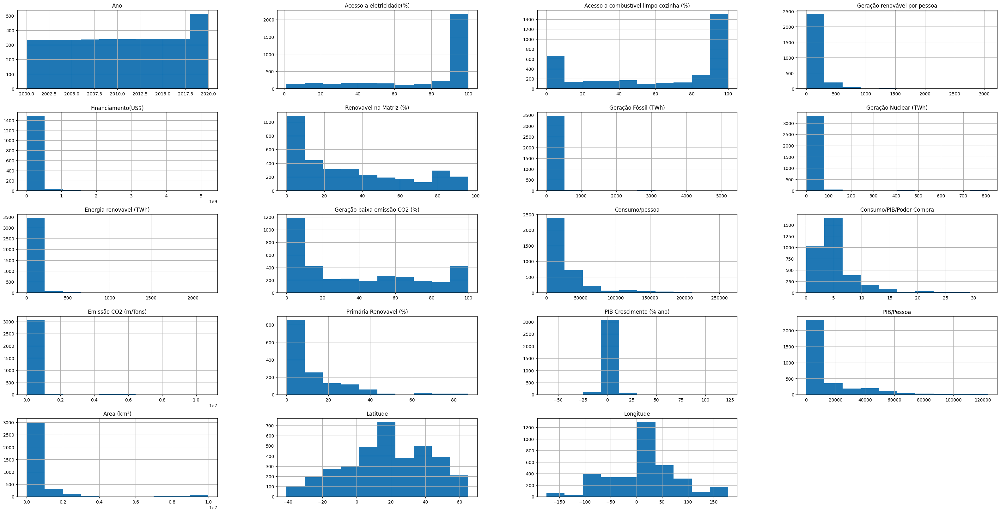

In [ ]:
#Visualização do gráfico histograma
dataset_merge.hist(figsize = (40,20))
plt.show()

Acima foram exibidos os histogramas de cada atributo, onde é possível visualizar a distribuição das variaveis quantitativas, onde é possível verificar se a distribuição é normal, assimétrica a esquerda, bimodal ou multimodal.

Em geral, observa-se na maioria uma distribuição assimétrica a esquerda ou a direita e somente o Ano e a latitude aparentando uma distribuição normal.

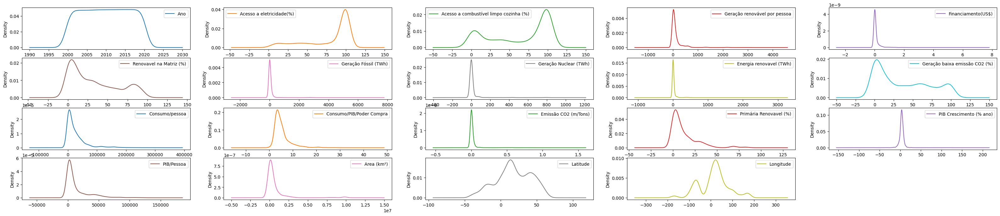

In [ ]:
# Visualização do Gráfico de Densidade de cada Atributo
dataset_merge.plot(kind = "density", subplots = True, layout = (5,5), sharex = False, figsize = (40,10))
plt.show()

A curva de densidade é similar ao histograma. Porém é possível verificar melhor a distribuição e a uniformidade das curvas.

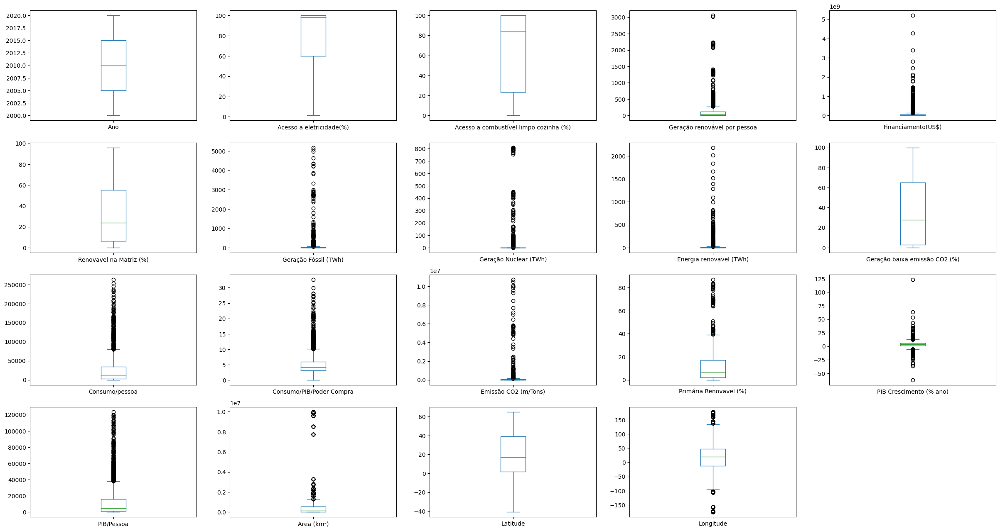

In [ ]:
#Visualização do Box Plot de cada Atributo
dataset_merge.plot(kind = 'box', subplots = True, layout = (5,5), sharex = False, sharey = False, figsize = (30,20))
plt.show()



Neste gráfico, é possível visualizar a concentração dos dados em cima dos quartis, a mediana dos dados de cada atributo e possíveis outliers.

*   No Boxplot de Acesso a eletricidade que a maior concentração está acima de 60% e a mediana é superior a 95%, o que indica que pouquissimos paises não possuem acesso a eletricidade.

*   No caso do Boxplot do atributo Pop que depende de energia limpa, a amplitude do gráfico é bem grande, o que indica que existe uma distribuição bem variada dos resultados, entretanto, a mediana é superior a 80%.


*   Nos casos dos atributos: Geração renovável por pessoa, Financiamento, Geração fóssil, Geração Nuclear, Energia renovavel e Emissão de CO2, os gráficos estão muito achatados, onde é possível verificar uma alta concentração dos valores e uma presença de outliers que estão atrapalhando a visualização da concentração dos valores.

No entanto, esses valores não são outliers propriamente ditos e sim valores possíveis e muito superiores, devido a disparidade entre os países mais ricos e os mais pobres.

##3.3 Visualizações multimodais

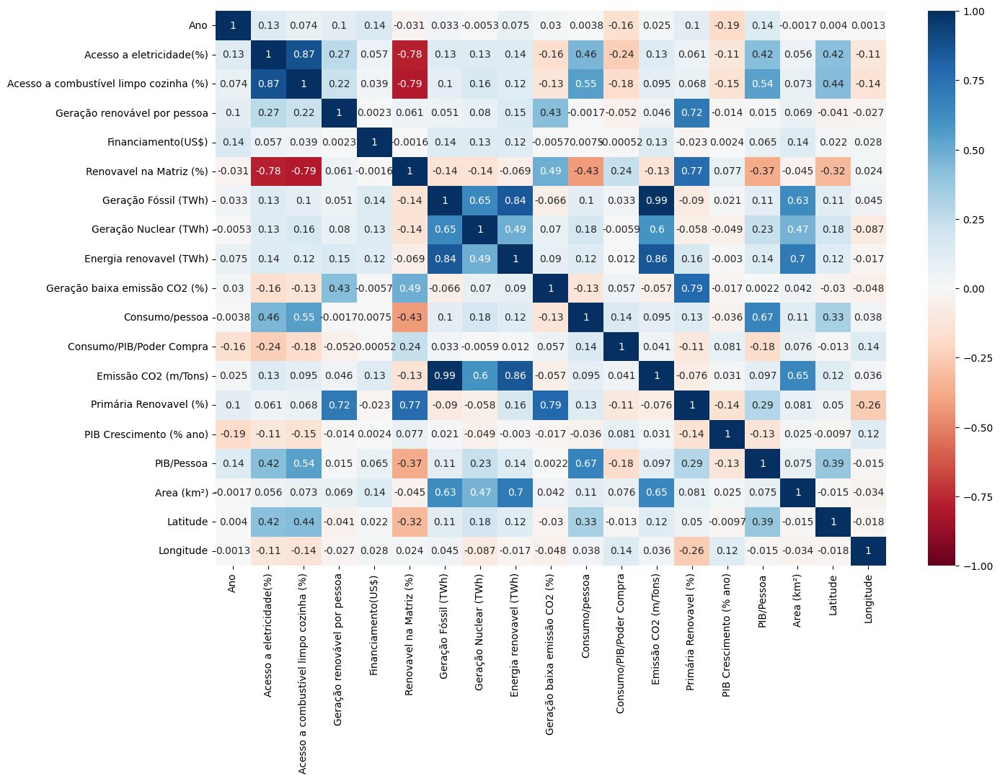

In [ ]:
#Visualização do gráfico de calor
plt.figure(figsize = (15,10))
sns.heatmap(dataset_merge.corr(numeric_only=True), annot = True, cmap = 'RdBu', vmin = -1, vmax =1);

Neste gráfico, é possível observar uma forte correlação, acima de 0,7 entre as colunas:
* Energia renovável e Area
*Acesso a eletricidade e Acesso a combustível limpo cozinha
*Primária Renovável e Geração Renovavel por pessoa
*Primária Renovavel e Renovavel na Matriz
*Energia baixa emissão CO2 e Primária Renovável.

E observamos uma correlação negativa, abaixo de 0,7 entre:
* Acesso a eletricidade e Acesso a combustível limpo cozinha
*Acesso a eletricidade com Renovavel na matriz  

É interessante observar que existe uma correlação alta com as colunas Energia Renovável e Geração Fóssil. O que não quer dizer que exista uma relação de causa entre as duas, e sim que paises que possuem energias geradas por combustíveis fosseis, também investem em fontes de energia renovaveis, provavelmente para aumentar o fornecimento de energia para a população.

E existe uma correlação negativa baixa entre Consumo/Pessoa (kWh/person) e Renovável na Matriz (%), entretanto, seria importante realizar um aprofundamento neste estudo, tendo em vista que não é muito comum países com alto consumo de energia possuirem uma alta porcentagem de geração de energia renovavel na matriz energética, sendo necessário, em geral, utilizar energias não renovaveis para suprir a demanda energética.


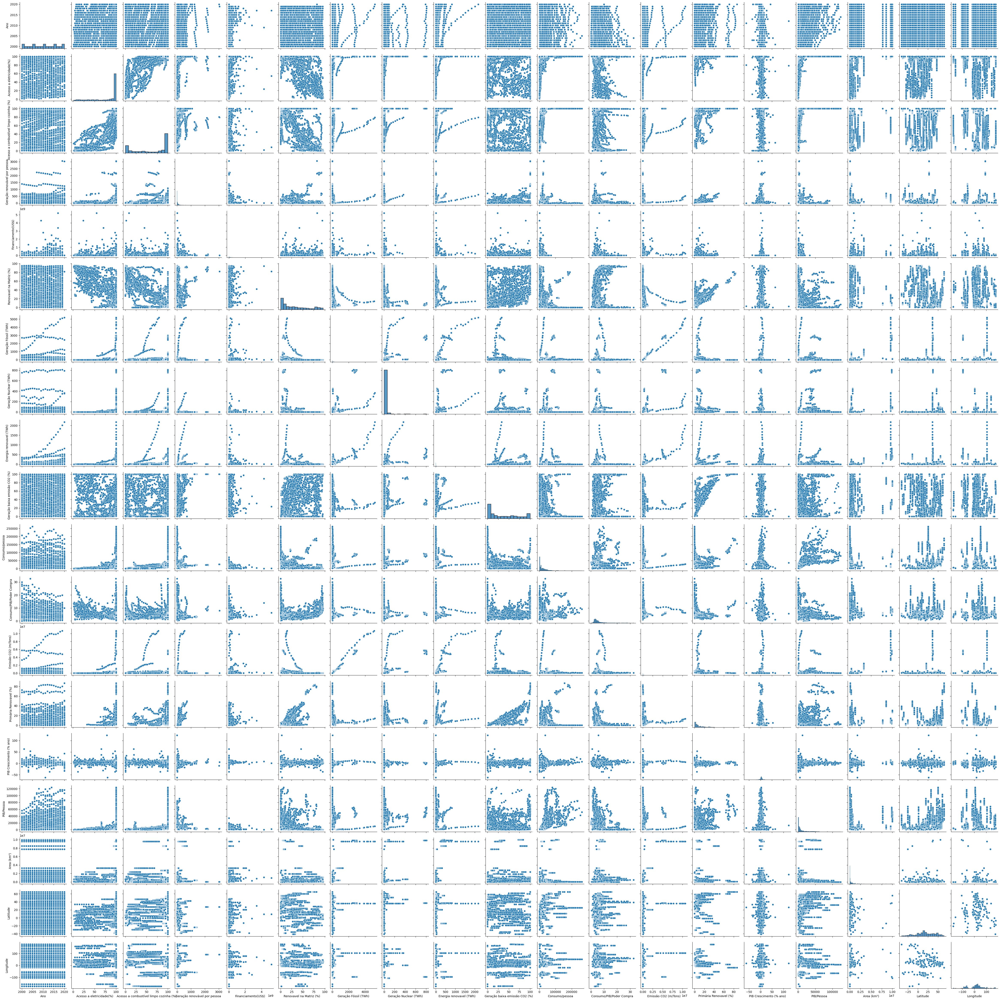

In [ ]:
# Visualização do gráfico de dispersão entre todas as variáveis
sns.pairplot(dataset_merge)

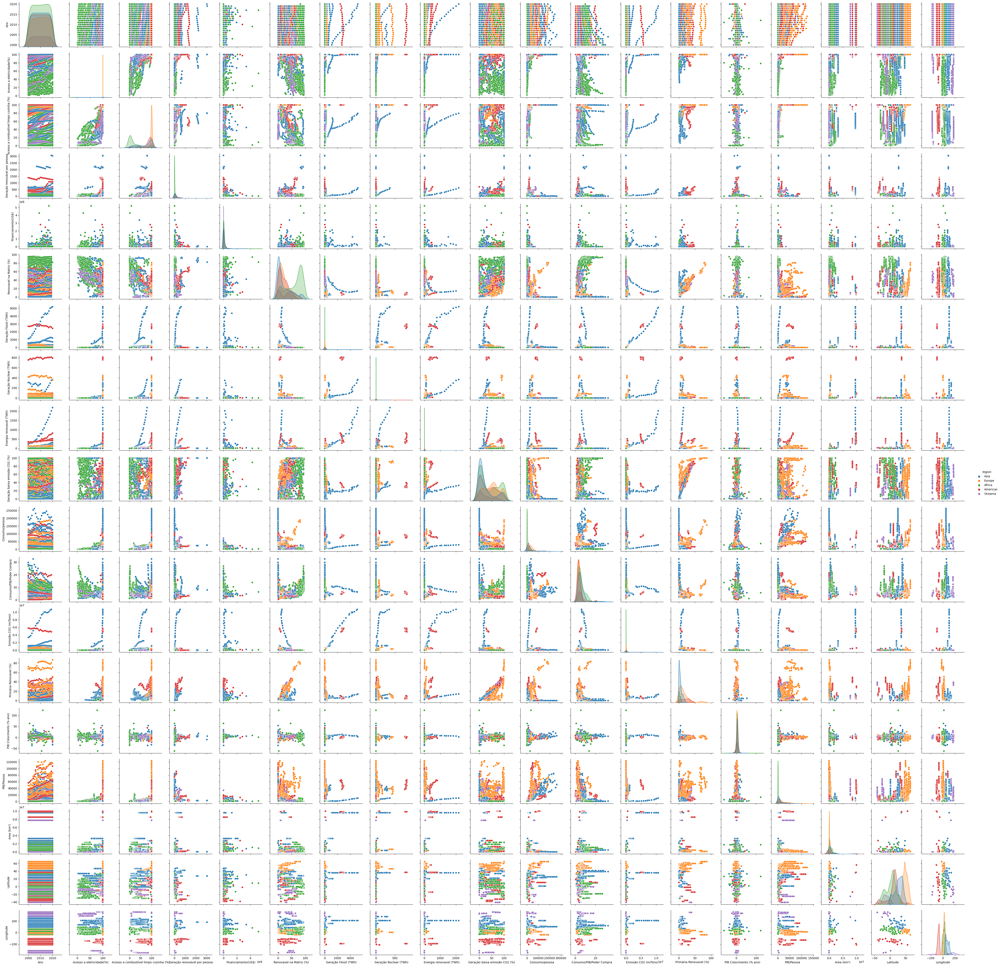

In [ ]:
# Visualização do gráfico de dispersão entre todas as variáveis, separados por continentes "region"
sns.pairplot(dataset_merge, hue = "region", height = 2.5);

Por esses gráficos, é possível visualizar a correlação entre duas variáveis e as conclusões possíveis são se a correlação é negativa, positiva, forte ou fraca, similar ao que é visulizado no gráfico de calor. Posteriormente, serão visualizados alguns gráficos de dispersão das variáveis com maior correlação positiva ou negativa.

#4. Pré-Processamento de dados

In [ ]:
#Verificação dos valores missing no Dataset
dataset_merge.isnull().sum()

País                                         0
Ano                                          0
Acesso a eletricidade(%)                     8
Acesso a combustível limpo cozinha (%)     169
Geração renovável por pessoa               868
Financiamento(US$)                        2018
Renovavel na Matriz (%)                    190
Geração Fóssil (TWh)                        21
Geração Nuclear (TWh)                      126
Energia renovavel (TWh)                     21
Geração baixa emissão CO2 (%)               42
Consumo/pessoa                               0
Consumo/PIB/Poder Compra                   203
Emissão CO2 (m/Tons)                       424
Primária Renovavel (%)                    2094
PIB Crescimento (% ano)                    295
PIB/Pessoa                                 260
Densidade Pop (P/km²)                        1
Area (km²)                                   1
Latitude                                     1
Longitude                                    1
region       

Foi possível observar que os valores País e Ano não possuem missings e que existe uma quantidade de missings consideravel nas variaveis Financiamento, o que não significa que são erros no dataset, tendo em vista que é posssível que não exista financiamentos ou energia renovaveis nos paises. Entretanto, serão observados mais profundamente a seguir o porque da existência dessa quantidade de missings.

<Axes: >

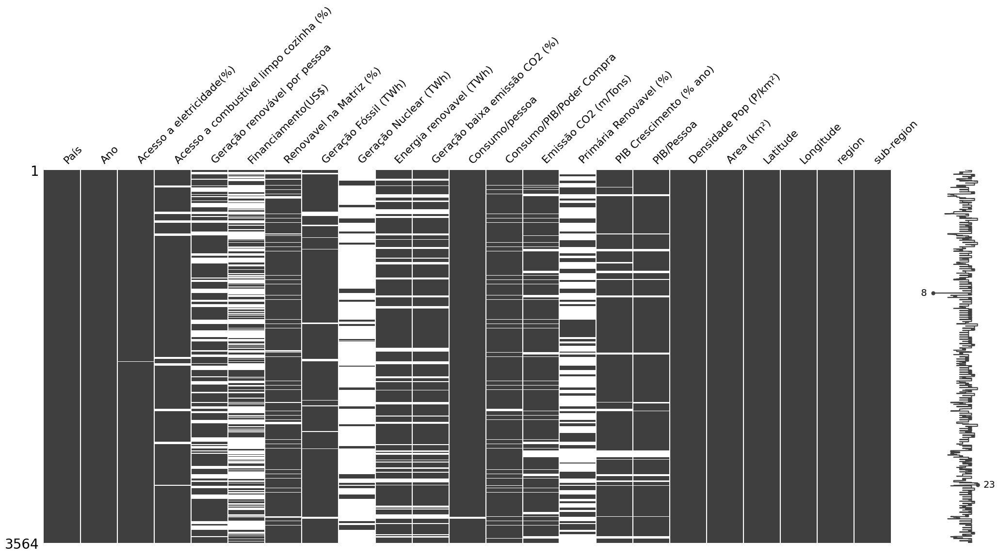

In [ ]:
#Verificando a matriz de distribuição dos missings no dataset
col = list(dataset_merge.columns)
datasettratado = dataset_merge[col[:]]
datasettratado.replace(0, np.nan, inplace = True)

#Exibindo a Matriz do Dataset
ms.matrix(datasettratado)

Nesta matriz é possível visualizarmos, de forma gráfica, a quantidade de valores missings no dataset, como podemos visualizar, as colunas Geração renovavel por pessoa, Financiamento, Geração Nuclear e Primária Renovável, os quais serão verificados quais tipos de tratamento serão dados a seguir.

In [ ]:
#Verificando a quantidade de missings no dataset
datasettratado.isnull().sum()

País                                         0
Ano                                          0
Acesso a eletricidade(%)                     8
Acesso a combustível limpo cozinha (%)     177
Geração renovável por pessoa              1082
Financiamento(US$)                        2043
Renovavel na Matriz (%)                    285
Geração Fóssil (TWh)                       162
Geração Nuclear (TWh)                     3007
Energia renovavel (TWh)                    639
Geração baixa emissão CO2 (%)              639
Consumo/pessoa                              21
Consumo/PIB/Poder Compra                   203
Emissão CO2 (m/Tons)                       424
Primária Renovavel (%)                    2152
PIB Crescimento (% ano)                    296
PIB/Pessoa                                 260
Densidade Pop (P/km²)                        1
Area (km²)                                   1
Latitude                                     1
Longitude                                    1
region       

Acima é possível visualizarmos, de de forma numérica, a quantidade de valores missings no dataset.

<Axes: >

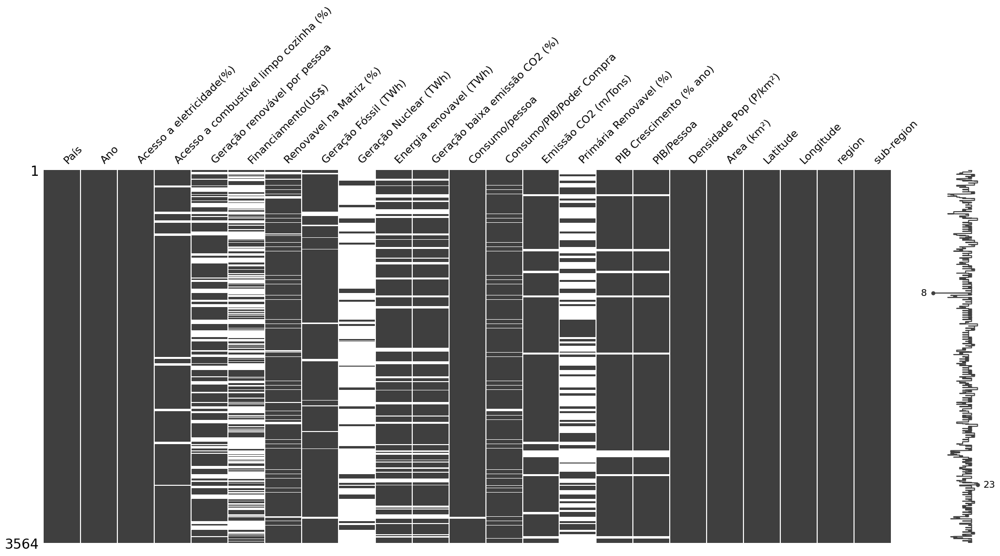

In [ ]:
#Realizando a substituição dos missings da coluna País
media_por_País = datasettratado.groupby("País")["Acesso a eletricidade(%)"].transform("median")
datasettratado["Acesso a eletricidade(%)"] = datasettratado["Acesso a eletricidade(%)"].fillna(media_por_País)

#Realizando a substituição dos missings da coluna PIB Crescimento (% ano)
media_por_Crescimento_PIB = datasettratado.groupby("País")["PIB Crescimento (% ano)"].transform("median")
datasettratado["PIB Crescimento (% ano)"] = datasettratado["PIB Crescimento (% ano)"].fillna(media_por_Crescimento_PIB)

#Realizando a substituição dos missings da coluna PIB/Pessoa
media_por_PIB_Pessoa = datasettratado.groupby("País")["PIB/Pessoa"].transform("median")
datasettratado["PIB/Pessoa"] = datasettratado["PIB/Pessoa"].fillna(media_por_PIB_Pessoa)

#Realizando a substituição dos missings da coluna Emissão CO2 (m/Tons)
media_por_Emissao_CO2 = datasettratado.groupby("País")["Emissão CO2 (m/Tons)"].transform("median")
datasettratado["Emissão CO2 (m/Tons)"] = datasettratado["Emissão CO2 (m/Tons)"].fillna(media_por_Emissao_CO2)

#Exibindo visualização matricial de nulidade no dataset
ms.matrix(datasettratado)

Nesse caso, foi realizada a substituição pela mediana entre os valores relativos aos paises, nas colunas em questão, durante os 20 anos.

<Axes: >

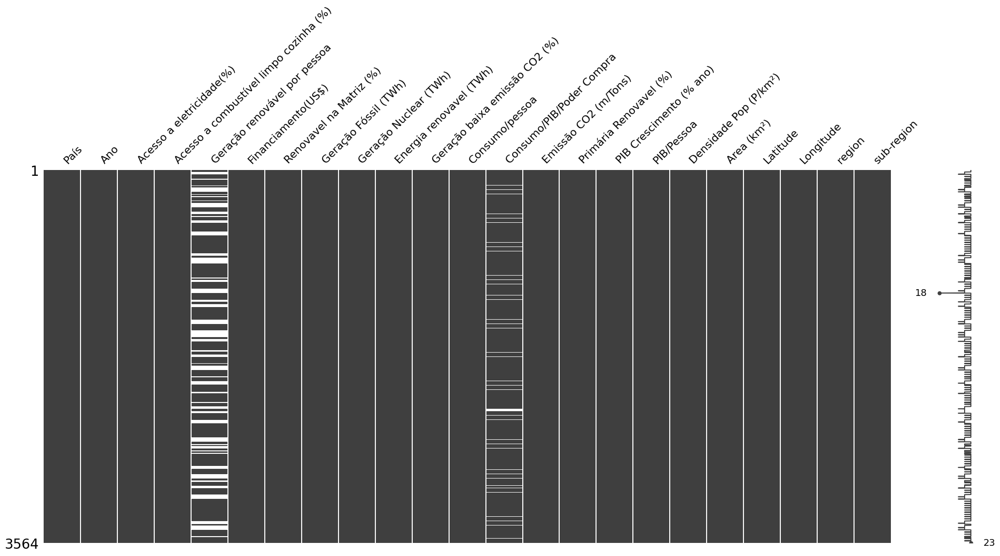

In [ ]:
#Substituindo os Nans por 0 - voltando aos valores originais da coluna
datasettratado["Primária Renovavel (%)"].fillna(0, inplace=True)
datasettratado["Geração baixa emissão CO2 (%)"].fillna(0, inplace=True)
datasettratado["Acesso a combustível limpo cozinha (%)"].fillna(0, inplace=True)
datasettratado["Financiamento(US$)"].fillna(0, inplace=True)
datasettratado["Geração Fóssil (TWh)"].fillna(0, inplace=True)
datasettratado["Geração Nuclear (TWh)"].fillna(0, inplace=True)
datasettratado["Energia renovavel (TWh)"].fillna(0, inplace=True)
datasettratado["Consumo/pessoa"].fillna(0, inplace=True)
datasettratado["Acesso a eletricidade(%)"].fillna(0, inplace=True)
datasettratado["PIB Crescimento (% ano)"].fillna(0, inplace=True)
datasettratado["PIB/Pessoa"].fillna(0, inplace=True)
datasettratado["Emissão CO2 (m/Tons)"].fillna(0, inplace=True)

#Substituindo os Nans pelo valor anterior - voltando aos valores originais da coluna
datasettratado["Renovavel na Matriz (%)"].fillna(method ='ffill', inplace = True)

#Exibindo visualização matricial de nulidade no dataset
ms.matrix(datasettratado)

Foi verificado que alguns dos valores missings no dataset seriam valores possíivels e portanto, optou-se pela sua substituição pelo zero, tendo em vista que a exclusáo desses valores afetaria às analises a serem realizadas.

No caso da coluna Renovavel na matriz, foi realizada a substituição do valor ausente pelo valor anterior a este, tendo em vista que a tendência dessa coluna é ter uma evolução ao longo do tempo e os valores ausentes são referentes ao ano de 2020 que não tinham sido preenchidos no momento da criação do dataset.

In [ ]:
#excluindo colunas dataset
datasettratado = datasettratado.drop(["Geração renovável por pessoa", "Consumo/PIB/Poder Compra"], axis=1)

#Exibindo as primeiras linhas do dataset
datasettratado.head()

,País,Ano,Acesso a eletricidade(%),Acesso a combustível limpo cozinha (%),Financiamento(US$),Renovavel na Matriz (%),Geração Fóssil (TWh),Geração Nuclear (TWh),Energia renovavel (TWh),Geração baixa emissão CO2 (%),...,Emissão CO2 (m/Tons),Primária Renovavel (%),PIB Crescimento (% ano),PIB/Pessoa,Densidade Pop (P/km²),Area (km²),Latitude,Longitude,region,sub-region
0,Afghanistan,2001,4.074574,7.2,130000.0,45.60,0.09,0.0,0.50,84.745766,...,730.000000,0.0,3.918294,494.179350,60,652230.0,33.93911,67.709953,Asia,Southern Asia
1,Afghanistan,2002,9.409158,8.2,3950000.0,37.83,0.13,0.0,0.56,81.159424,...,1029.999971,0.0,3.918294,179.426579,60,652230.0,33.93911,67.709953,Asia,Southern Asia
2,Afghanistan,2003,14.738506,9.5,25970000.0,36.66,0.31,0.0,0.63,67.021280,...,1220.000029,0.0,8.832278,190.683814,60,652230.0,33.93911,67.709953,Asia,Southern Asia
3,Afghanistan,2004,20.064968,10.9,0.0,44.24,0.33,0.0,0.56,62.921350,...,1029.999971,0.0,1.414118,211.382074,60,652230.0,33.93911,67.709953,Asia,Southern Asia
4,Afghanistan,2005,25.390894,12.2,9830000.0,33.88,0.34,0.0,0.59,63.440857,...,1549.999952,0.0,11.229715,242.031313,60,652230.0,33.93911,67.709953,Asia,Southern Asia


Foi necessário realizar a exclusão da coluna Geração renovável por pessoa, tendo em vista que este possuia diversos valores nulos/ausentes que deveriam estar preenchidos.
Embora fosse uma coluna que poderia ajudar em algumas análises, optou-se por realizar sua retirada do dataset, pois a falta de preenchimento em casos onde seria necessário estar preenchido, poderia causar uma análise enviezada ou errada, portanto, optou-se pela sua exclusão.

Foi excluída a coluna Consumo/PIB/Poder Compra, tendo em vista que esta coluna não acrescentaria nada nas análises, então optou-se por sua exclusão.



#5. Visualizações e Análise de Dados

##5.1 Análise da variação ao longo dos anos

###5.1.1 Análise da variação da Energia Renovável (2000-2020) e Energia Nuclear

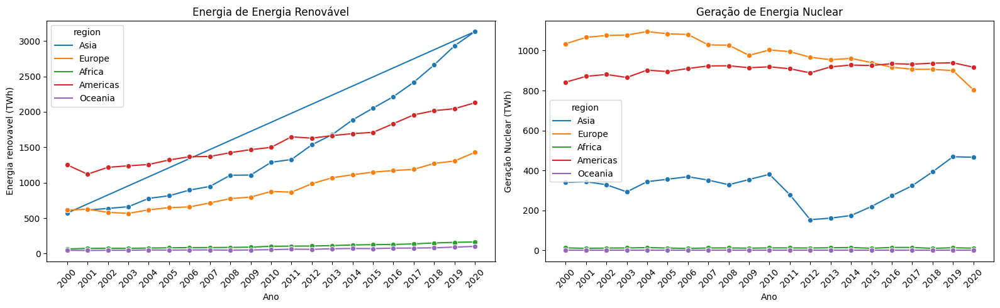

In [ ]:
# os dois gráficos lado a lado
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,5))

# Configurar os rótulos do eixo x na vertical
for ax in axes:
    ax.set_xticks([2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020])
    ax.tick_params(axis='x', rotation=45)  # Rotacionar os rótulos do eixo x

# Primeiro gráfico
sns.lineplot(data=datasettratado, x="Ano", y="Energia renovavel (TWh)", hue="region", estimator="sum", errorbar=None, marker="o", sort=False, ax=axes[0])
axes[0].set_title('Energia de Energia Renovável')

# Segundo gráfico
sns.lineplot(data=datasettratado, x="Ano", y="Geração Nuclear (TWh)", hue="region", estimator="sum", errorbar=None, marker="o", ax=axes[1])
axes[1].set_title('Geração de Energia Nuclear')

# Ajustar o layout para evitar sobreposição
plt.tight_layout()

# Mostrar os gráficos
plt.show()

Neste gráfico, é possível visualizar um aumento na geração de energia renovável em todos os continentes, com maior crescimento da Ásia, Americas e Europa e um aumento bem baixo da Oceania e África.

Podemos observar também que a Ásia é o continente com a maior Geração de Energia Renovável e a Oceania com a menor geração por fontes renováveis.

Pelo gráfico acima, é possível verificar uma queda na geração de energia nuclear na Europa, um leve acrescimo nas américas, uma establidade para África e Oceania e um leve aumento após uma queda da Ásia.

Podemos observar também que as Américas são os continentes com a maior Geração de Energia Nuclear, onde aproximadamente em 2016, passaram a liderar, ultrapassando o continente Europeu. Por outro lado, a Oceania se manteve estável com a menor Geração de Energia Fóssil.

###5.1.2 Análise do variação da Geração de Energia Nuclear (2000-2020) e Consumo de CO2

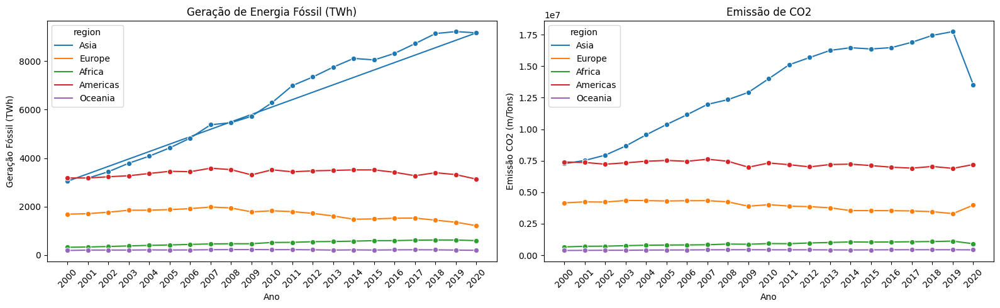

In [ ]:
# os dois gráficos lado a lado
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,5))

# Configurar os rótulos do eixo x na vertical
for ax in axes:
    ax.set_xticks([2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020])
    ax.tick_params(axis='x', rotation=45)  # Rotacionar os rótulos do eixo x

# Primeiro gráfico
sns.lineplot(data=datasettratado, x="Ano", y="Geração Fóssil (TWh)", hue="region", estimator="sum", errorbar=None, marker="o", sort=False, ax=axes[0])
axes[0].set_title('Geração de Energia Fóssil (TWh)')

# Segundo gráfico
sns.lineplot(data=datasettratado, x="Ano", y="Emissão CO2 (m/Tons)", hue="region", estimator="sum", errorbar=None, marker="o", ax=axes[1])
axes[1].set_title('Emissão de CO2')

# Ajustar o layout para evitar sobreposição
plt.tight_layout()

# Mostrar os gráficos
plt.show()

Por este gráfico é possível visualizar um aumento consideravel da geração de energia por combustíveis fósseis na Asia, uma establidade nos continentes Africano e Oceania e uma pequena redução no continente Europeu.

Podemos observar também que a Ásia é o continente com a maior Geração de Energia Fóssil e a Oceania com a menor Geração de Energia Fóssil.

É possível observar, ainda, uma leve queda na Geração por energias Fósseis em 2008, devido à crise econômica ocorrida à época.

Pelo gráfico acima, é possível verificar uma grande elevação na emissão de CO2 na Ásia, provavelmente decorrente da elavação da geração de energia por combustíveis fósseis, uma pequena redução na Europa, e uma estabilidade nos outros continentes.

###5.1.3 Análise do variação do Consumo por Pessoa e PIB/Pessoa

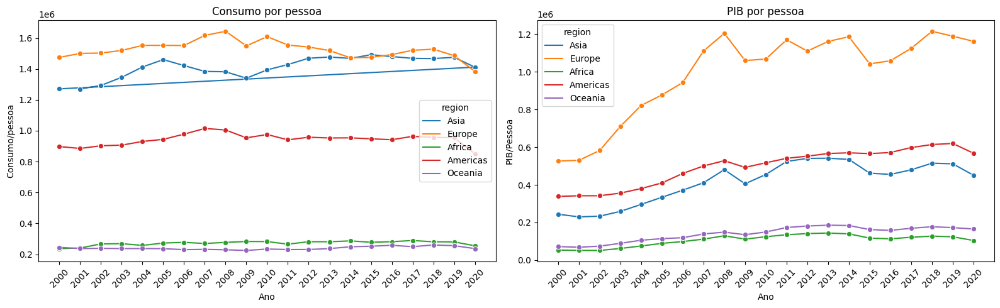

In [ ]:
# os dois gráficos lado a lado
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16,5))

# Configurar os rótulos do eixo x na vertical
for ax in axes:
    ax.set_xticks([2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020])
    ax.tick_params(axis='x', rotation=45)  # Rotacionar os rótulos do eixo x

# Primeiro gráfico
sns.lineplot(data=datasettratado, x="Ano", y="Consumo/pessoa", hue="region", estimator="sum", errorbar=None, marker="o", sort=False, ax=axes[0])
axes[0].set_title('Consumo por pessoa')

# Segundo gráfico
sns.lineplot(data=datasettratado, x="Ano", y="PIB/Pessoa", hue="region", estimator="sum", errorbar=None, marker="o", ax=axes[1])
axes[1].set_title('PIB por pessoa')

# Ajustar o layout para evitar sobreposição
plt.tight_layout()

# Mostrar os gráficos
plt.show()

Com isso, é possível verificar uma pequena redução do consumo nos continentes Europeu e América, principalmente após 2019, uma estabilidade de Oceania e África e uma pequena elevação da Ásia.

O PIB por pessoa teve um crescimento de todos os continentes, mas principalmente no continente Europeu, entretanto, é possível observar uma leve queda em 2009 e 2015 de todos os Continentes.

##5.2 Análise da Dispersão entre os atributos

###5.2.1 - Análise da Dispersão entre Emissão CO2 e Energia renovavel

<Axes: xlabel='Emissão CO2 (m/Tons)', ylabel='Energia renovavel (TWh)'>

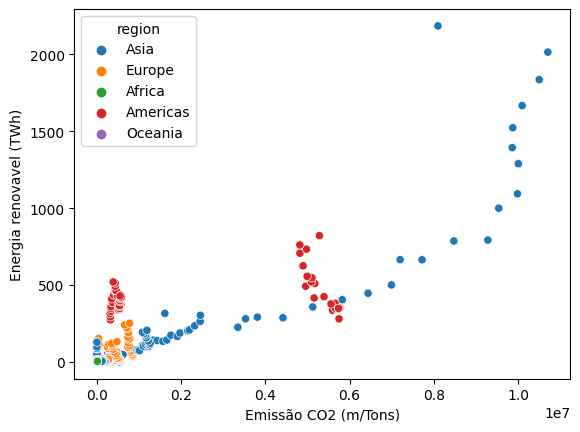

In [ ]:
sns.scatterplot(datasettratado, x="Emissão CO2 (m/Tons)", y="Energia renovavel (TWh)", hue="region")


Neste gráfico é possível visualizar uma forte correlação positiva entre os atributos, entretanto, uma grande dispersão.

###5.2.2 Análise da Dispersão entre a Área e a Geração de Energia Renovável

<Axes: xlabel='Area (km²)', ylabel='Energia renovavel (TWh)'>

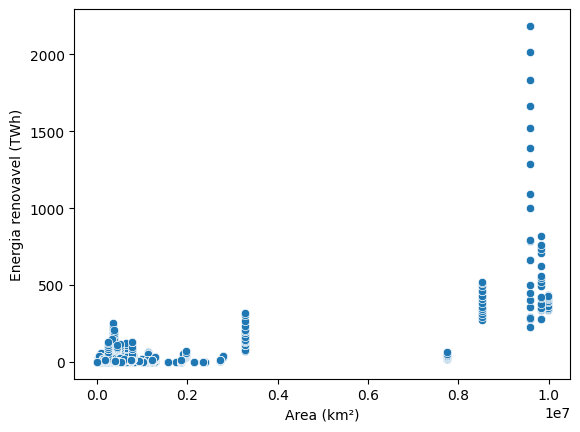

In [ ]:
#Visualizando o gráfico de dispersão entre a Área e a Geração de Energia Renovável
sns.scatterplot(datasettratado, x="Area (km²)", y="Energia renovavel (TWh)")

Existe uma correlação Forte, indicada pelo mapa de calor, entretanto não fica muito clara no gráfico de dispersão.

###5.2.3 Análise da Dispersão entre o PIB/Pessoa e o Consumo por pessoa

<Axes: xlabel='PIB/Pessoa', ylabel='Consumo/pessoa'>

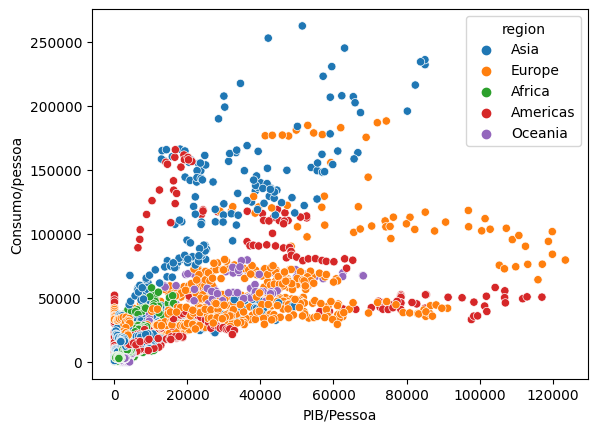

In [ ]:
#Visualizando o gráfico de dispersão entre o PIB/Pessoa e o Consumo/Pessoa
sns.scatterplot(datasettratado, x="PIB/Pessoa", y="Consumo/pessoa", hue="region")

Neste gráfico é possível visualizar uma correlação moderada no geral, com bastante dispersão, entretanto, existe uma correlação alta no continente Ásiático, enquanto no continente Europeu ela é um pouco inferior.

###5.2.4 Análise da Dispersão entre o Acesso a Eletricidade e o Acesso a combustível limpo na cozinha

<Axes: xlabel='Acesso a eletricidade(%)', ylabel='Acesso a combustível limpo cozinha (%)'>

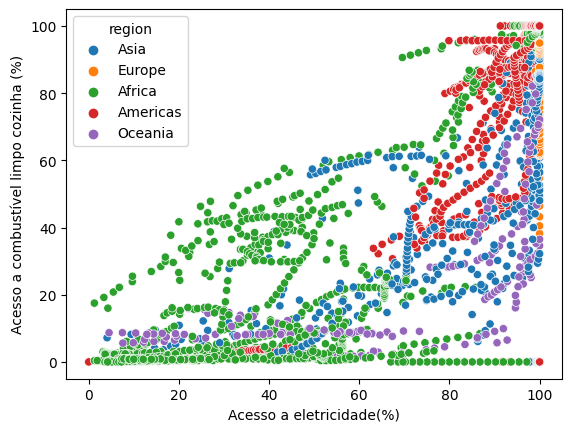

In [ ]:
#Visualizando o gráfico de dispersão entre o Acesso a eletricidade(%) e o Acesso a combustível limpo cozinha (%)
sns.scatterplot(datasettratado, x="Acesso a eletricidade(%)", y="Acesso a combustível limpo cozinha (%)", hue="region")

###5.2.5 Análise da Dispersão entre a porcentagem de renovável na matriz e a porcentagem de energia renovável primária

<Axes: xlabel='Primária Renovavel (%)', ylabel='Renovavel na Matriz (%)'>

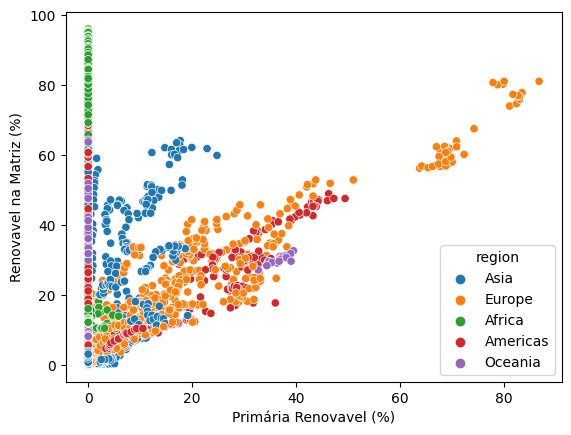

In [ ]:
#Visualizando o gráfico de dispersão entre a Primária Renovavel (%) e a Renovavel na Matriz (%)
sns.scatterplot(datasettratado, x="Primária Renovavel (%)", y="Renovavel na Matriz (%)", hue="region")

Aqui é possível verificar uma correlação Forte, bastante simétrica entre os continentes. É possível visualizar uma dispersão consideravel no continente Asiatico.

###5.2.6 Análise da Dispersão entre a Energia Primária por fonte renovável e a geração de baixa emissão de CO2

<Axes: xlabel='Primária Renovavel (%)', ylabel='Geração baixa emissão CO2 (%)'>

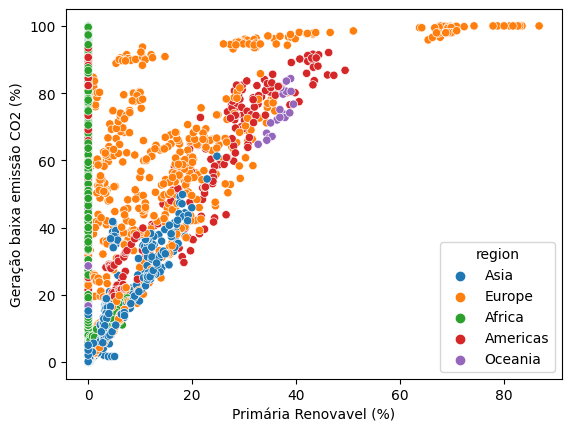

In [ ]:
#Visualizando o gráfico de dispersão entre a Primária Renovavel (%) e a Geração baixa emissão CO2 (%)
sns.scatterplot(datasettratado, x="Primária Renovavel (%)", y="Geração baixa emissão CO2 (%)", hue="region")

Aqui é possível visualizar uma correlação forte, um pouco simétrica entre os continentes.

###5.2.7 Análise da Dispersão entre a porcentagem de energia renovável na matriz e de acesso a combustível limpo para cozinha

<Axes: xlabel='Renovavel na Matriz (%)', ylabel='Acesso a combustível limpo cozinha (%)'>

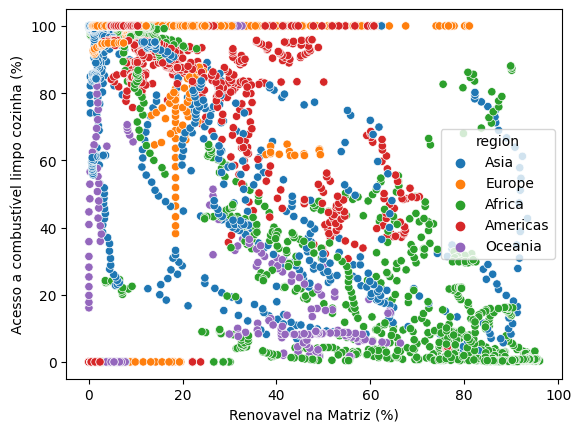

In [ ]:
#Visualizando o gráfico de dispersão entre a Renovavel na Matriz (%) e a Acesso a combustível limpo cozinha (%)
sns.scatterplot(datasettratado, x="Renovavel na Matriz (%)", y="Acesso a combustível limpo cozinha (%)", hue="region")

É possível visualizar uma correlação negativa Forte, porém, com bastante dispersão.

###5.2.8 Análise da Dispersão entre a porcentagem de Acesso a Eletricidade e Energia Renovavel na Matriz Energética

<Axes: xlabel='Acesso a eletricidade(%)', ylabel='Renovavel na Matriz (%)'>

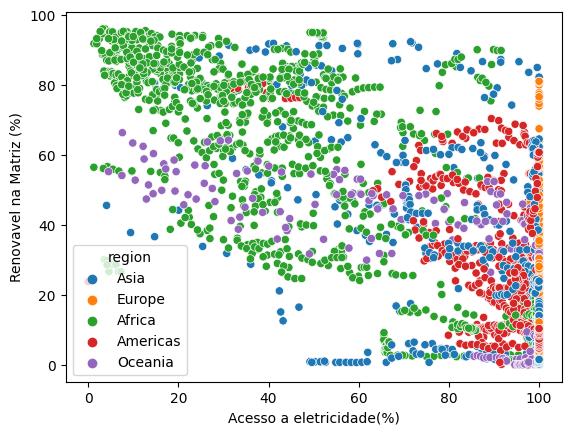

In [ ]:
#Visualizando o gráfico de dispersão entre a Acesso a eletricidade(%) e Renovavel na Matriz (%)
sns.scatterplot(datasettratado, x="Acesso a eletricidade(%)", y="Renovavel na Matriz (%)", hue="region")


É possível visualizar uma correlação negativa Forte, porém, com bastante dispersão.

##5.3 Análise dos países com maior Geração/Consumo


###5.3.1 Análise dos países com maior geração de Energia renovavel (TWh)

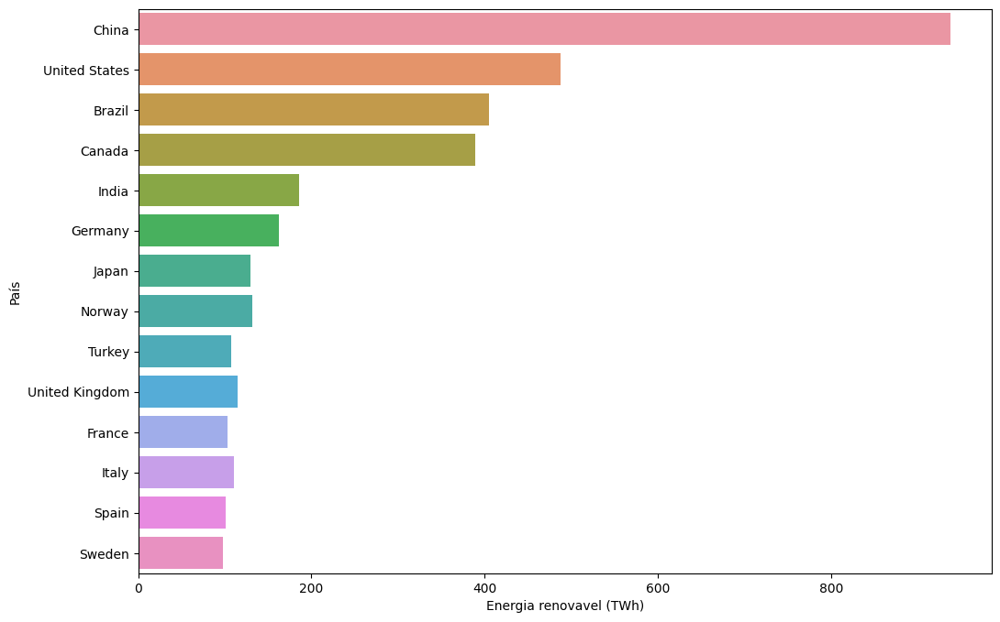

In [ ]:
#Organizando o DF com base na coluna 'Energia renovavel (TWh)' em ordem decrescente
df_sorted = datasettratado.sort_values(by='Energia renovavel (TWh)', ascending=False)

#Selecionando as primeiras 200 linhas do DataFrame ordenado
top_20 = df_sorted.head(200)

#Definindo o gráfico de barras utilizando a biblioteca seaborn
ax = sns.barplot(x='Energia renovavel (TWh)', y='País', data=top_20, errorbar=None)

#Definindo o tamanho da figura
ax.figure.set_size_inches(12, 8)

Neste gráfico é possível visualizar a China como a maior produtora de Energia Renovável com quase o dobro do segundo lugar, seguida por EUA, Brasil e Canadá com mais que o dobro para Índia e os países abaixo.

###5.3.2 Análise dos países com maior geração de Energia Fóssil (TWh)

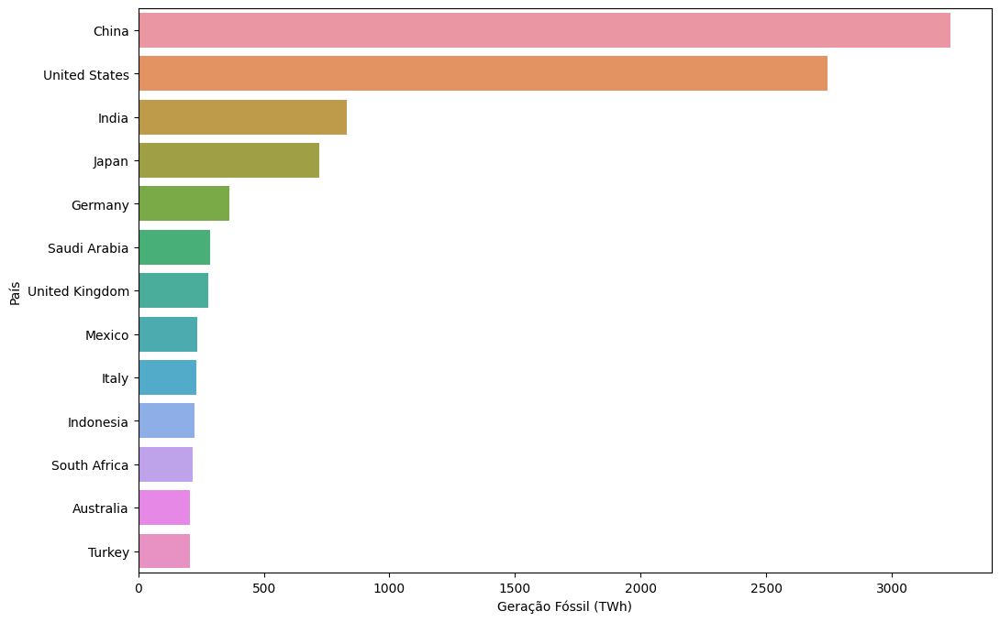

In [ ]:
#Organizando o DF com base na coluna 'Geração Fóssil (TWh)' em ordem decrescente
df_sorted = datasettratado.sort_values(by='Geração Fóssil (TWh)', ascending=False)

#Selecionando as primeiras 200 linhas do DataFrame ordenado
top_20 = df_sorted.head(200)

#Definindo o gráfico de barras utilizando a biblioteca seaborn
ax = sns.barplot(x='Geração Fóssil (TWh)', y='País', data=top_20, errorbar=None)

#Definindo o tamanho da figura
ax.figure.set_size_inches(12, 8)

Neste gráfico é possível visualizar a China como a maior produtora de Energia Fóssil, seguida por EUA com um valor aproximado e abaixo os outros países com uma produção muito inferior.

###5.3.3 Análise dos países com maior Emissão CO2 (m/Tons)

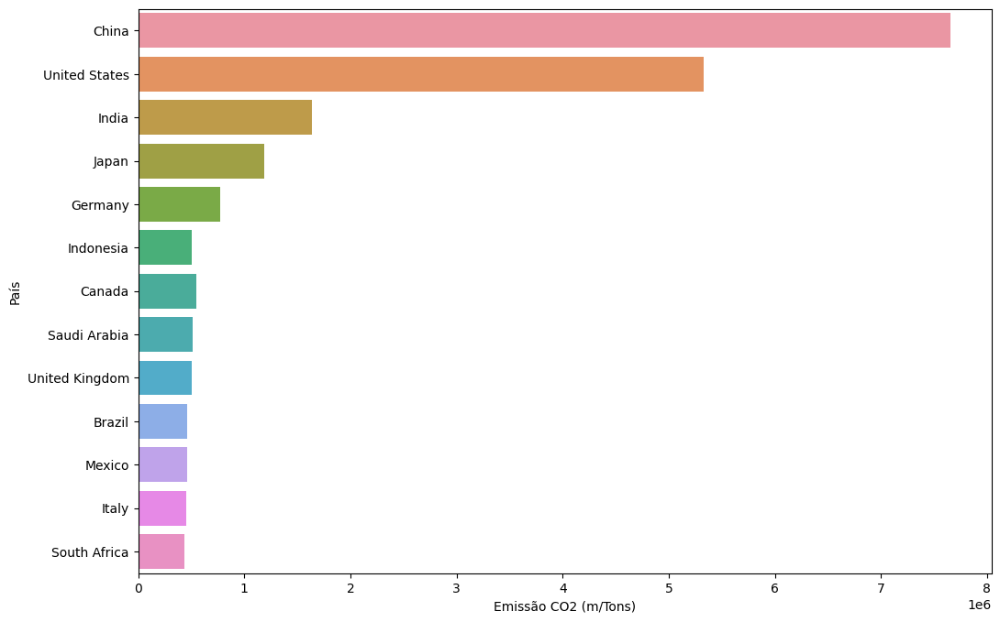

In [ ]:
#Organizando o DF com base na coluna 'Emissão CO2 (m/Tons)' em ordem decrescente
df_sorted = datasettratado.sort_values(by='Emissão CO2 (m/Tons)', ascending=False)

#Selecionando as primeiras 200 linhas do DataFrame ordenado
top_20 = df_sorted.head(200)

#Definindo o gráfico de barras utilizando a biblioteca seaborn
ax = sns.barplot(x='Emissão CO2 (m/Tons)', y='País', data=top_20, errorbar=None)

#Definindo o tamanho da figura
ax.figure.set_size_inches(12, 8)

É possível visualizar uma similiridade entre os países com as maiores emissões de CO2 e os países com a maior geração por combustível fóssil, dada a alta correlação entre essas duas variáveis, chegando a 0,99, uma correlação muito forte.

###5.3.4 Análise dos países com maior Consumo/Pessoa

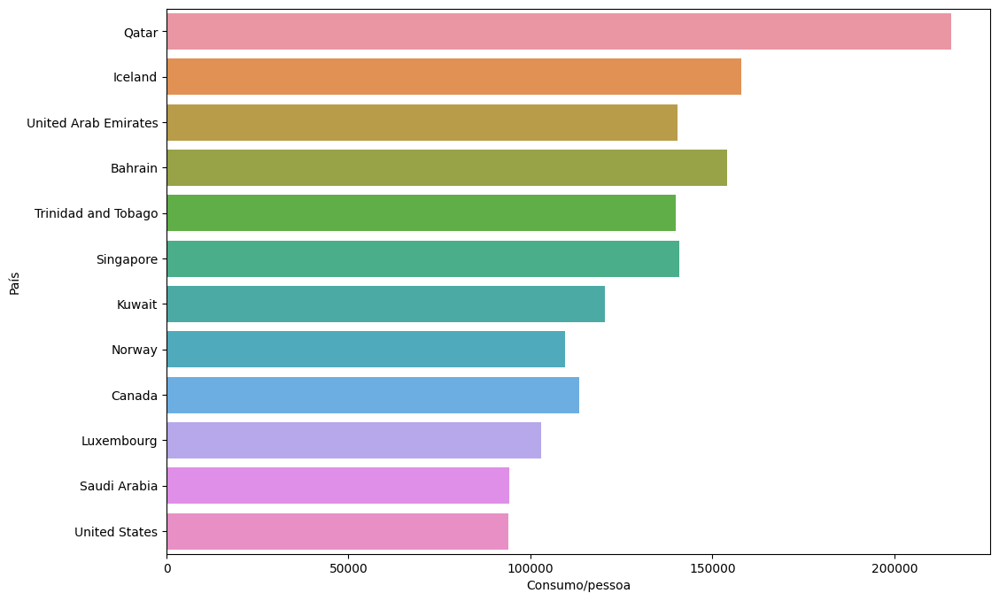

In [ ]:
#Organizando o DF com base na coluna 'Consumo/pessoa' em ordem decrescente
df_sorted = datasettratado.sort_values(by='Consumo/pessoa', ascending=False)

#Selecionando as primeiras 200 linhas do DataFrame ordenado
top_20 = df_sorted.head(200)

#Definindo o gráfico de barras utilizando a biblioteca seaborn
ax = sns.barplot(x='Consumo/pessoa', y='País', data=top_20, errorbar=None)

#Definindo o tamanho da figura
ax.figure.set_size_inches(12, 8)

###5.3.5 Análise dos Continentes e sua porcentagem de Energia Renovável na Matriz Energética

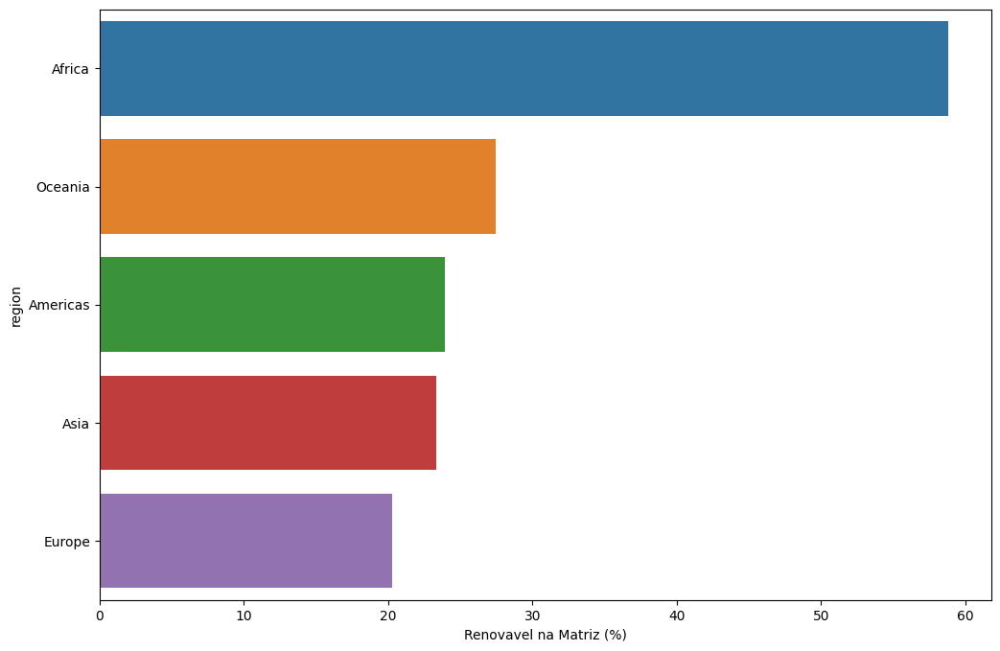

In [ ]:
# Ordene o DataFrame pelo percentual de 'Renovavel na Matriz (%)'
df_sorted = datasettratado.sort_values(by='Renovavel na Matriz (%)')

# Calcule a média do percentual de 'Renovavel na Matriz (%)' para cada região
C = df_sorted.groupby("region").mean(numeric_only=True).reset_index()

# Obtenha a ordem das regiões pelo maior percentual
order = C.sort_values('Renovavel na Matriz (%)', ascending=False)['region']

# Crie o gráfico de barras com as regiões ordenadas
ax = sns.barplot(x='Renovavel na Matriz (%)', y='region', data=C, order=order)

# Ajuste o tamanho da figura
ax.figure.set_size_inches(12, 8)

# Exiba o gráfico
plt.show()

Acima, é possível observar que o Continente Africano tem o maior percentual de energia renovavel na matriz energética, seguida da Oceania.

###5.3.6 Análise dos Continentes e sua porcentagem de Emissão de CO2

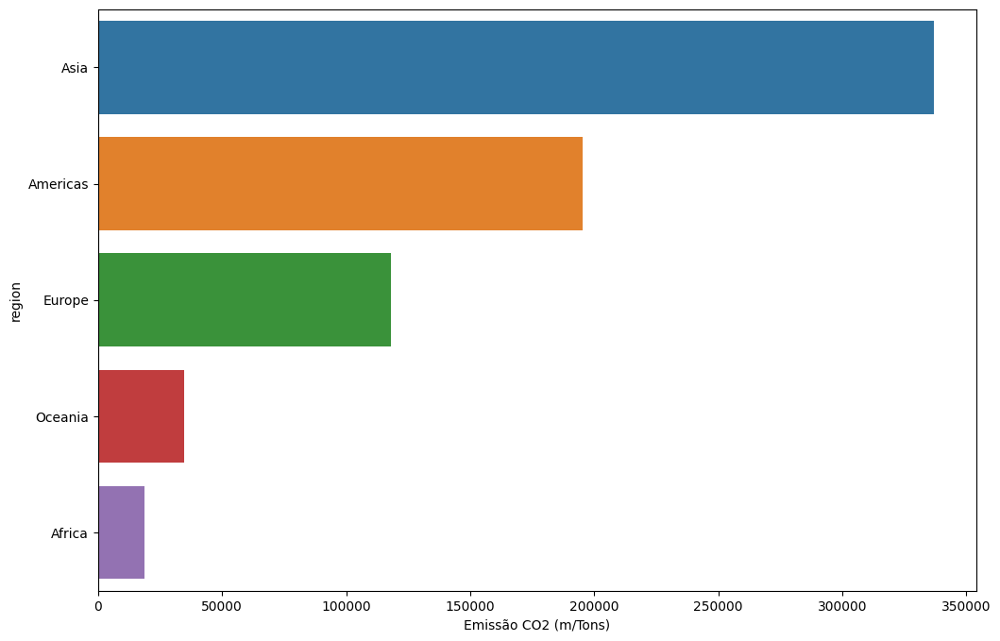

In [ ]:
#Ordenando o DataFrame pelo percentual de 'Renovavel na Matriz (%)'
df_sorted = datasettratado.sort_values(by='Emissão CO2 (m/Tons)')

#Calculando a média do percentual de 'Renovavel na Matriz (%)' para cada região
C = df_sorted.groupby("region").mean(numeric_only=True).reset_index()

#Ordenando das regiões pelo maior percentual
order = C.sort_values('Emissão CO2 (m/Tons)', ascending=False)['region']

#Criando o gráfico de barras com as regiões ordenadas
ax = sns.barplot(x='Emissão CO2 (m/Tons)', y='region', data=C, order=order)

#Realizando o ajuste do tamanho da figura
ax.figure.set_size_inches(12, 8)

# Exiba o gráfico
plt.show()

Neste gráfico é possivel visualizar que o continente com a maior emissão de CO2 é a Ásia, seguida das Américas e Europa.

Os países com o maior consumo por pessoa não estão entre a lista dos maiores geradores de energia renovavel ou fóssil, tendo em vista que esses países que estão nesse gráfico são paises com uma pequena população, em maioria, entretanto, com um consumo alto de energia.

A China que é o país com os maiores valores de geração de energia está fora dessa lista, assim como a ìndia por serem países extremamente populosos, o que diminui o valor de consumo por pessoa.

##5.4 Comparativo da parcela de Geração de Energia Renovável por continentes ao longo dos anos


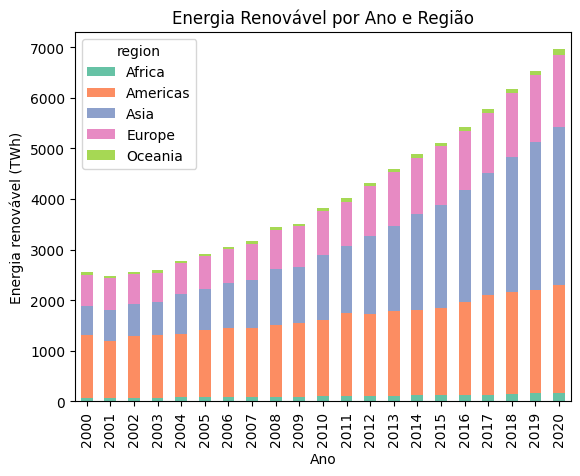

In [ ]:
#Pivotando o DataFrame
df_pivoted = datasettratado.pivot_table(index='Ano', columns='region', values='Energia renovavel (TWh)', aggfunc='sum')

#Especificando uma paleta de cores
vcmap = plt.get_cmap("Set2")

#Extraindo a lista de cores em hex
colors = [mpl.colors.rgb2hex(vcmap(i)) for i in range(8)] # extrai lista de cores em hex

#Criando o gráfico de barras empilhadas
df_pivoted.plot(kind='bar', stacked=True, color=colors)

# Adiciona rótulos e título ao gráfico
plt.xlabel('Ano')
plt.ylabel('Energia renovável (TWh)')
plt.title('Energia Renovável por Ano e Região')

# Exibe o gráfico
plt.show()

Neste gráfico, é possível visualizar um aumento na Geração por Energia Renovável ao longo dos 20 anos, com uma elevação, principalmente na Ásia.

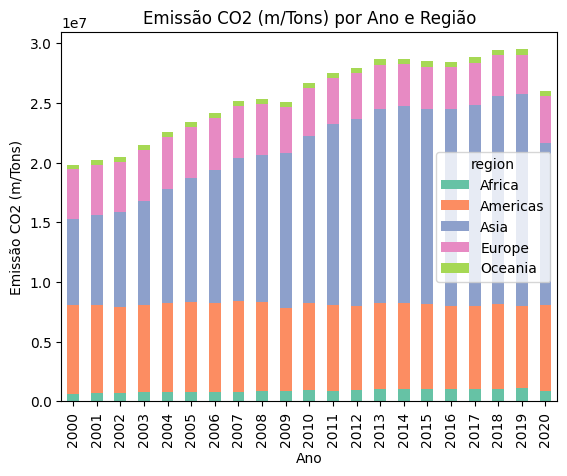

In [ ]:
#Pivotando o DataFrame
df_CO2_pivoted = datasettratado.pivot_table(index='Ano', columns='region', values='Emissão CO2 (m/Tons)', aggfunc='sum')

#Especificando uma paleta de cores
vcmap = plt.get_cmap("Set2")

#Extraindo a lista de cores em hex
colors = [mpl.colors.rgb2hex(vcmap(i)) for i in range(8)] # extrai lista de cores em hex

#Criando o gráfico de barras empilhadas
df_CO2_pivoted.plot(kind='bar', stacked=True, color=colors)

# Adiciona rótulos e título ao gráfico
plt.xlabel('Ano')
plt.ylabel('Emissão CO2 (m/Tons)')
plt.title('Emissão CO2 (m/Tons) por Ano e Região')

# Exibe o gráfico
plt.show()

Neste gráfico podemos verificar uma elevação de emissão de CO2 ao ano, principalmente, na Ásia, ainda que na Europa tenha havido uma pequena redução.

Entretanto, no ano de 2020, percebe-se uma redução considerável na Emissão de CO2 no continente Asiático.

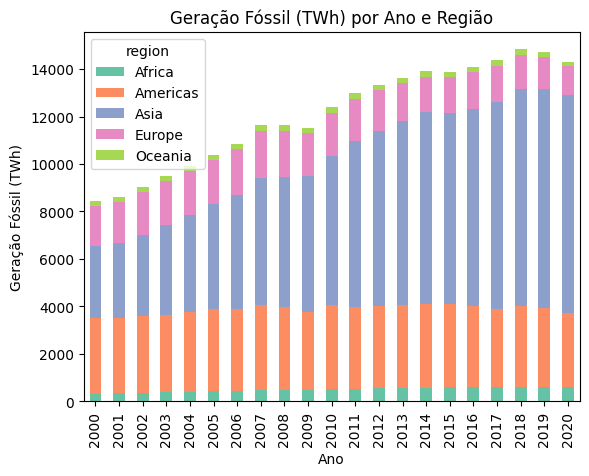

In [ ]:
#Pivotando o DataFrame
df_Fossil_pivoted = datasettratado.pivot_table(index='Ano', columns='region', values='Geração Fóssil (TWh)', aggfunc='sum')

#Especificando uma paleta de cores
vcmap = plt.get_cmap("Set2")

#Extraindo a lista de cores em hex
colors = [mpl.colors.rgb2hex(vcmap(i)) for i in range(8)] # extrai lista de cores em hex

#Criando o gráfico de barras empilhadas
df_Fossil_pivoted.plot(kind='bar', stacked=True, color=colors)

# Adiciona rótulos e título ao gráfico
plt.xlabel('Ano')
plt.ylabel('Geração Fóssil (TWh)')
plt.title('Geração Fóssil (TWh) por Ano e Região')

# Exibe o gráfico
plt.show()

Neste gráfico é possível visualizar uma grande elevação no Consumo de energia fóssil, exceto nas Américas que parece haver uma estabade e na Europa que parece haver uma redução.

#6. Conclusão

A emissão de CO2 tem causado consequências muito perigosas no que diz respeito ao meio ambiente e às condições climáticas, o que aumenta a necessidade do investimento na redução da Emissão de CO2.

Neste Notebook foi possível observar uma alta correlação entre Energia Fóssil e Emissão de CO2, chegando a quase 1.

Foi possível observar ainda que existe uma correlação negativa entre o PIB/Pessoa e Consumo por pessoa e a porcentagem de energia renovavél na matriz.

Foi possível observar também que existe uma relação Forte entre baixa emissão de CO2 e Energia Renovável Primária na Matriz energética.

No gráfico com os maiores paises que emitem CO2, dos 4 primeiros, 3 são da Ásia e o continente com a maior emissão de CO2 foi o continente Asiático.

Então uma das soluções para redução de emissão de CO2 seria um investimento na substituição da Energia Fóssil pela Energia Renovável, com um foco alto no continente Asiático, principalmente na China e Índia.

#7. Preparação do Modelo para Machine Learning

In [ ]:
#Visualizando as informações do dataset
datasettratado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3564 entries, 0 to 3563
Data columns (total 21 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   País                                    3564 non-null   object 
 1   Ano                                     3564 non-null   int64  
 2   Acesso a eletricidade(%)                3564 non-null   float64
 3   Acesso a combustível limpo cozinha (%)  3564 non-null   float64
 4   Financiamento(US$)                      3564 non-null   float64
 5   Renovavel na Matriz (%)                 3564 non-null   float64
 6   Geração Fóssil (TWh)                    3564 non-null   float64
 7   Geração Nuclear (TWh)                   3564 non-null   float64
 8   Energia renovavel (TWh)                 3564 non-null   float64
 9   Geração baixa emissão CO2 (%)           3564 non-null   float64
 10  Consumo/pessoa                          3564 non-null   floa

In [ ]:
#excluindo as colunas desnecessárias do dataset
dataset_ml = datasettratado.drop(["País","Ano","Acesso a combustível limpo cozinha (%)","Financiamento(US$)","Renovavel na Matriz (%)","Geração baixa emissão CO2 (%)","Primária Renovavel (%)","PIB Crescimento (% ano)","Area (km²)","Latitude","Longitude", "Densidade Pop (P/km²)"], axis=1)

#Visualizando as primeiras colunas do novo dataset
dataset_ml.head()

,Acesso a eletricidade(%),Geração Fóssil (TWh),Geração Nuclear (TWh),Energia renovavel (TWh),Consumo/pessoa,Emissão CO2 (m/Tons),PIB/Pessoa,region,sub-region
0,4.074574,0.09,0.0,0.50,236.89185,730.000000,494.179350,Asia,Southern Asia
1,9.409158,0.13,0.0,0.56,210.86215,1029.999971,179.426579,Asia,Southern Asia
2,14.738506,0.31,0.0,0.63,229.96822,1220.000029,190.683814,Asia,Southern Asia
3,20.064968,0.33,0.0,0.56,204.23125,1029.999971,211.382074,Asia,Southern Asia
4,25.390894,0.34,0.0,0.59,252.06912,1549.999952,242.031313,Asia,Southern Asia


In [ ]:
#Visualizando as informações do novo dataset
dataset_ml.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3564 entries, 0 to 3563
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Acesso a eletricidade(%)  3564 non-null   float64
 1   Geração Fóssil (TWh)      3564 non-null   float64
 2   Geração Nuclear (TWh)     3564 non-null   float64
 3   Energia renovavel (TWh)   3564 non-null   float64
 4   Consumo/pessoa            3564 non-null   float64
 5   Emissão CO2 (m/Tons)      3564 non-null   float64
 6   PIB/Pessoa                3564 non-null   float64
 7   region                    3564 non-null   object 
 8   sub-region                3564 non-null   object 
dtypes: float64(7), object(2)
memory usage: 278.4+ KB


In [ ]:
#Criação de um DataFrame temporário com a coluna region a ser codificada
one_hot_encoded = pd.get_dummies(dataset_ml['region'], prefix='region')

#Realizando a Concatenação do DataFrame temporário com o DataFrame original
dataset_ml = pd.concat([dataset_ml, one_hot_encoded], axis=1)

#Removendo a coluna original 'region' se desejar
dataset_ml = dataset_ml.drop('region', axis=1)

#Visualizando as primeiras linhas do dataset
dataset_ml.head()

,Acesso a eletricidade(%),Geração Fóssil (TWh),Geração Nuclear (TWh),Energia renovavel (TWh),Consumo/pessoa,Emissão CO2 (m/Tons),PIB/Pessoa,sub-region,region_Africa,region_Americas,region_Asia,region_Europe,region_Oceania
0,4.074574,0.09,0.0,0.50,236.89185,730.000000,494.179350,Southern Asia,0,0,1,0,0
1,9.409158,0.13,0.0,0.56,210.86215,1029.999971,179.426579,Southern Asia,0,0,1,0,0
2,14.738506,0.31,0.0,0.63,229.96822,1220.000029,190.683814,Southern Asia,0,0,1,0,0
3,20.064968,0.33,0.0,0.56,204.23125,1029.999971,211.382074,Southern Asia,0,0,1,0,0
4,25.390894,0.34,0.0,0.59,252.06912,1549.999952,242.031313,Southern Asia,0,0,1,0,0


In [ ]:
#Criando um DataFrame temporário com a coluna sub-region a ser codificada
one_hot_encoded = pd.get_dummies(dataset_ml['sub-region'], prefix='sub-region')

#Realizando a concatenação do DataFrame temporário com o DataFrame original
dataset_ml = pd.concat([dataset_ml, one_hot_encoded], axis=1)

#Removendo a coluna original 'region' se desejar
dataset_ml = dataset_ml.drop('sub-region', axis=1)

#Visualizando as primeiras linhas do Dataset
dataset_ml.head()

,Acesso a eletricidade(%),Geração Fóssil (TWh),Geração Nuclear (TWh),Energia renovavel (TWh),Consumo/pessoa,Emissão CO2 (m/Tons),PIB/Pessoa,region_Africa,region_Americas,region_Asia,...,sub-region_Northern Africa,sub-region_Northern America,sub-region_Northern Europe,sub-region_Polynesia,sub-region_South-eastern Asia,sub-region_Southern Asia,sub-region_Southern Europe,sub-region_Sub-Saharan Africa,sub-region_Western Asia,sub-region_Western Europe
0,4.074574,0.09,0.0,0.50,236.89185,730.000000,494.179350,0,0,1,...,0,0,0,0,0,1,0,0,0,0
1,9.409158,0.13,0.0,0.56,210.86215,1029.999971,179.426579,0,0,1,...,0,0,0,0,0,1,0,0,0,0
2,14.738506,0.31,0.0,0.63,229.96822,1220.000029,190.683814,0,0,1,...,0,0,0,0,0,1,0,0,0,0
3,20.064968,0.33,0.0,0.56,204.23125,1029.999971,211.382074,0,0,1,...,0,0,0,0,0,1,0,0,0,0
4,25.390894,0.34,0.0,0.59,252.06912,1549.999952,242.031313,0,0,1,...,0,0,0,0,0,1,0,0,0,0


In [ ]:
#Separando o Dataset em Input e Output
x = dataset_ml.values[:,[0,1,2,4,5,6,7,8]]
y = dataset_ml.values[0,3]

In [ ]:
#Normalização dos dados
rescaledx = MinMaxScaler().fit_transform(x)

#Exibindo os dados transformados
print("Dados originais", dataset_ml.values)
print ("Dados Normalizados", rescaledx)

Dados originais [[ 4.074574  0.09      0.       ...  0.        0.        0.      ]
 [ 9.409158  0.13      0.       ...  0.        0.        0.      ]
 [14.738506  0.31      0.       ...  0.        0.        0.      ]
 ...
 [45.572647  3.73      0.       ...  1.        0.        0.      ]
 [46.781475  3.66      0.       ...  1.        0.        0.      ]
 [52.74767   3.4       0.       ...  1.        0.        0.      ]]
Dados Normalizados [[4.07457400e-02 1.73606758e-05 0.00000000e+00 ... 4.00099230e-03
  0.00000000e+00 0.00000000e+00]
 [9.40915800e-02 2.50765316e-05 0.00000000e+00 ... 1.45267981e-03
  0.00000000e+00 0.00000000e+00]
 [1.47385060e-01 5.97978832e-05 0.00000000e+00 ... 1.54382103e-03
  0.00000000e+00 0.00000000e+00]
 ...
 [4.55726470e-01 7.19503562e-04 0.00000000e+00 ... 1.01578790e-02
  1.00000000e+00 0.00000000e+00]
 [4.67814750e-01 7.06000814e-04 0.00000000e+00 ... 1.06606422e-02
  1.00000000e+00 0.00000000e+00]
 [5.27476700e-01 6.55847751e-04 0.00000000e+00 ... 9.8329